In [1]:
import functools
import math
import numpy as np
from tqdm import tqdm, trange

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import torch
import torch.nn as nn
from torch.nn import init
import torch.optim as optim
import torch.nn.functional as F
from torch.nn import Parameter as P
from torch.distributions import MultivariateNormal, Normal, Independent, Uniform

import torchvision

import pyro 
from pyro.infer import MCMC, NUTS, HMC

from functools import partial

import os, sys
cwd = os.getcwd()

api_path = os.path.join(cwd, '..', 'tools')
sys.path.append(api_path)

%load_ext autoreload

Populating the interactive namespace from numpy and matplotlib


In [2]:
import os
import sys

path_to_repo = os.path.join(cwd, '..', '..', 'BigGAN-PyTorch')
sys.path.append(path_to_repo)

In [3]:
import inception_utils
import biggan_utils
import biggan_losses

import classification as cl
import mh
#based on https://github.com/uber-research/metropolis-hastings-gans/blob/master/mhgan/mh.py
import torchvision.utils as vutils

In [4]:
from ebm_sampling import (langevin_sampling, 
                          mala_sampling,
                          xtry_langevin_sampling,
                          gan_energy,
                          Gaussian_mixture,
                          IndependentNormal,
                          DotDict)

In [5]:
def image_dump(X, name, dir_):
    '''This is to isolate torch stuff out.
    X : ndarray, shape (n, nc, image_size, image_size)
    name : str
    '''
    batch_size, nc, image_size, _ = X.shape
    assert X.shape == (batch_size, nc, image_size, image_size)

    fname = os.path.join(dir_, '%s.png' % name)
    vutils.save_image(torch.tensor(X), fname, normalize=True)

In [6]:
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms

def get_data_loader(dataroot, workers, image_size, batch_size):
    dataset = dset.ImageFolder(root=dataroot,
                               transform=transforms.Compose([
                                   transforms.Resize(image_size),
                                   transforms.CenterCrop(image_size),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5),
                                                        (0.5, 0.5, 0.5)),
                               ]))

    data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                              shuffle=True,
                                              num_workers=int(workers))
    return data_loader

In [7]:
arguments = ["--dataset", "I128_hdf5", "--parallel", "--shuffle", 
             "--num_workers", "8", "--batch_size", "36", 
             "--num_G_accumulations", "8", "--num_D_accumulations", "8", 
             "--num_D_steps", "1", "--G_lr", "1e-4", "--D_lr", "4e-4", 
             "--D_B2", "0.999", "--G_B2", "0.999", "--G_attn", "64", 
             "--D_attn", "64", "--G_ch", "96", "--D_ch", "96", 
             "--G_nl", "inplace_relu", "--D_nl", "inplace_relu",
             "--SN_eps", "1e-6", "--BN_eps", "1e-5", "--adam_eps", "1e-6", 
             "--G_ortho", "0.0", "--G_shared", "--G_init", "ortho", 
             "--D_init", "ortho", "--skip_init", "--hier", "--dim_z", "120",
             "--shared_dim", "128", "--ema", "--ema_start", "20000", 
             "--use_multiepoch_sampler", "--test_every", "2000",
             "--save_every", "1000", "--num_best_copies", "5", 
             "--num_save_copies",  "2", "--seed", "0", "--skip_init", 
             "--G_batch_size", "16", "--use_ema", "--G_eval_mode",
             "--sample_trunc_curves", "0.05_0.05_1.0",  
             "--sample_inception_metrics", "--sample_npz",
             "--samples_root", "/home/daniil/gans-mcmc/BigGAN-PyTorch/samples",
             "--sample_random", "--sample_sheets", "--sample_interps",
             "--experiment_name", "138k", 
             "--weights_root", "/home/daniil/gans-mcmc/BigGAN-PyTorch/weights"]

parser = biggan_utils.prepare_parser()
parser = biggan_utils.add_sample_parser(parser)
config = vars(parser.parse_args(arguments))
#for key in config.keys():
#    print(key, config[key])

# Downloading

In [8]:
state_dict = {'itr': 0, 'epoch': 0, 'save_num': 0, 'save_best_num': 0,
                'best_IS': 0, 'best_FID': 999999, 'config': config}
                
# Optionally, get the configuration from the state dict. This allows for
# recovery of the config provided only a state dict and experiment name,
# and can be convenient for writing less verbose sample shell scripts.
if config['config_from_name']:
    biggan_utils.load_weights(None, None, state_dict, config['weights_root'], 
                          config['experiment_name'], config['load_weights'], None,
                          strict=False, load_optim=False)
      # Ignore items which we might want to overwrite from the command line
    for item in state_dict['config']:
        if item not in ['z_var', 'base_root', 'batch_size', 'G_batch_size', 'use_ema', 'G_eval_mode']:
            config[item] = state_dict['config'][item]

# update config (see train.py for explanation)
config['resolution'] = biggan_utils.imsize_dict[config['dataset']]
config['n_classes'] = biggan_utils.nclass_dict[config['dataset']]
config['G_activation'] = biggan_utils.activation_dict[config['G_nl']]
config['D_activation'] = biggan_utils.activation_dict[config['D_nl']]
config = biggan_utils.update_config_roots(config)
config['skip_init'] = True
config['no_optim'] = True
#device = 'cuda'
device = 'cpu'

# Seed RNG
biggan_utils.seed_rng(config['seed'])
  
# Setup cudnn.benchmark for free speed
torch.backends.cudnn.benchmark = True

# Import the model--this line allows us to dynamically select different files.
model = __import__(config['model'])
experiment_name = (config['experiment_name'] if config['experiment_name']
                      else biggan_utils.name_from_config(config))
print('Experiment name is %s' % experiment_name)

Experiment name is 138k


In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


/home/daniil/anaconda3/envs/myenv/lib/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729096996/work/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


In [10]:
%autoreload 2

In [11]:
G = model.Generator(**config).to(device)
biggan_utils.count_parameters(G)

D = model.Discriminator(**config).to(device)
biggan_utils.count_parameters(D)
# Load weights
print('Loading weights...')
# Here is where we deal with the ema--load ema weights or load normal weights
biggan_utils.load_weights(G if not (config['use_ema']) else None, D, state_dict, 
                    config['weights_root'], experiment_name, config['load_weights'],
                    G if config['ema'] and config['use_ema'] else None,
                    strict=False, load_optim=False, use_cpu = True)
# Update batch size setting used for G
G_batch_size = max(config['G_batch_size'], config['batch_size']) 
z_, y_ = biggan_utils.prepare_z_y(G_batch_size, G.dim_z, config['n_classes'],
                            device=device, fp16=config['G_fp16'], 
                            z_var=config['z_var'])

if config['G_eval_mode']:
    print('Putting G and D in eval mode..')
    G.eval()
    D.eval()
else:
    print('G is in %s mode...' % ('training' if G.training else 'eval'))
    print('D is in %s mode...' % ('training' if D.training else 'eval'))
    
for p in D.parameters():  
    p.requires_grad = False
for p in G.parameters():  
    p.requires_grad = False

Adding attention layer in G at resolution 64
Number of parameters: 70433988
Adding attention layer in D at resolution 64
Number of parameters: 87982370
Loading weights...
Loading weights from /home/daniil/gans-mcmc/BigGAN-PyTorch/weights/138k...
Putting G and D in eval mode..


# Example of generator images

In [16]:
sample = functools.partial(biggan_utils.sample, G=G, z_=z_, y_=y_, config=config)  

In [30]:
G_batch_size

36

In [29]:
if config['sample_random']:
    print('Preparing random sample sheet...')
    with torch.no_grad():
        z_ = torch.randn(G_batch_size, G.dim_z, requires_grad=False)
        y_ = 850*torch.ones(z_.shape[0], dtype=torch.long).to(z_.device)
        #if config['parallel']:
        #    G_z =  nn.parallel.data_parallel(G, (z_, G.shared(y_)))
        #else:
        G_z = G(z_, G.shared(y_))
            
    images, labels = G_z, y_
    torchvision.utils.save_image(images.float(),
                                 '%s/%s/random_samples.jpg' % (config['samples_root'], experiment_name),
                                 nrow=int(G_batch_size**0.5),
                                 normalize=True)

Preparing random sample sheet...


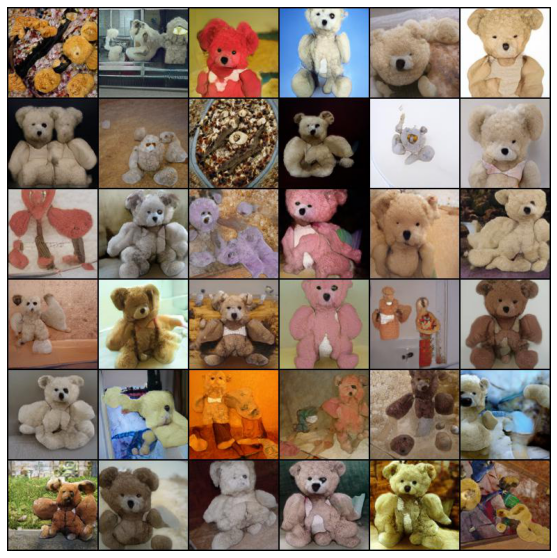

In [31]:
fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread('%s/%s/random_samples.jpg' % (config['samples_root'], experiment_name))
ax.imshow(img)
ax.axis('off')
plt.show()

In [10]:
def sample(G, z_, y_, config):
    with torch.no_grad():
        z_.sample_()
        y_.sample_()
        if config['parallel']:
            G_z =  nn.parallel.data_parallel(G, (z_, G.shared(y_)))
        else:
            G_z = G(z_, G.shared(y_))
            
        return G_z, y_

In [10]:
z_.shape

(36, 120)

In [40]:
num_clas = 
with torch.no_grad():
    z_.sample_()
    y_ = 850*torch.ones(z_.shape[0], dtype=torch.long).to(z_.device)
    if config['parallel']:
        G_z =  nn.parallel.data_parallel(G, (z_, G.shared(y_)))
    else:
        G_z = G(z_, G.shared(y_))

images, labels = G_z, y_

TypeError: gen_disc_f() missing 1 required positional argument: 'batch_size_fixed_'

In [ ]:
numpy_images = data[0].detach().cpu().numpy().transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_fixed**0.5)
fig = plt.figure(figsize=(10, 10))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_fixed):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

# Script for downloading images from ImageNet

https://github.com/itf/imagenet-download - taken from here

python imagenetDownloader.py n12144580 imagenet_corn -S --images=100 --minsize=7000 -j10

# ULA for BigGAN

In [12]:
n_dim = G.dim_z
loc = torch.zeros(n_dim).to(device)
scale = torch.ones(n_dim).to(device)
normal = Normal(loc, scale)
normalize_to_0_1 = True 
log_prob = True

num_class = 998

def gan_energy_biggan(z, num_class, generator, discriminator, proposal, normalize_to_0_1, log_prob=False):
    label = num_class*torch.ones(z.shape[0], dtype=torch.long).to(z.device)
    generator_points = generator(z, G.shared(label))
    if normalize_to_0_1:
        gan_part = -discriminator(generator_points, label).view(-1)
    else:
        sigmoid_gan_part = discriminator(generator_points, label)
        gan_part = -(torch.log(sigmoid_gan_part) - \
                     torch.log1p(-sigmoid_gan_part)).view(-1)
        
    proposal_part = -torch.sum(proposal.log_prob(z), dim=1)
    energy = gan_part + proposal_part
    if not log_prob:
        return energy
    else:
        return -energy

target_gan = partial(gan_energy_biggan,
                     num_class = num_class,
                     generator = G, 
                     discriminator = D, 
                     proposal = normal,
                     normalize_to_0_1 = normalize_to_0_1,
                     log_prob = log_prob)

proposal_args = DotDict()
proposal_args.device = device
proposal_args.loc = loc
proposal_args.scale = scale
proposal = IndependentNormal(proposal_args)

In [13]:
def grad_energy(point, target, x=None):
    point = point.detach().requires_grad_()
    if x is not None:
        energy = -target(z=point, x=x)
    else:
        energy = -target(point)
    grad = torch.autograd.grad(energy.sum(), point)[0]
    return energy, grad 

In [14]:
def langevin_dynamics(z, target, proposal, n_steps, grad_step, eps_scale):
    z_sp = []
    batch_size, z_dim = z.shape[0], z.shape[1]

    for _ in tqdm(range(n_steps)):
        z_sp.append(z)
        eps = eps_scale*proposal.sample([batch_size])

        E, grad = grad_energy(z, target, x=None)
        z = z - grad_step * grad + eps        
        z = z.data
        z.requires_grad_(True)
    z_sp.append(z)
    return z_sp

In [15]:
def mala_dynamics(z, target, proposal, n_steps, grad_step, eps_scale, acceptance_rule='Hastings'):
    z_sp = [z.clone().detach()]
    batch_size, z_dim = z.shape[0], z.shape[1]
    device = z.device

    uniform = Uniform(low = 0.0, high = 1.0)
    acceptence = torch.zeros(batch_size).to(device)

    for _ in tqdm(range(n_steps)):
        eps = eps_scale * proposal.sample([batch_size])

        E, grad = grad_energy(z, target, x=None)
        
        new_z = z - grad_step * grad + eps
        new_z = new_z.data
        new_z.requires_grad_(True)
        
        E_new, grad_new = grad_energy(new_z, target, x=None)
        
        energy_part = E - E_new
        
        propose_vec_1 = z - new_z + grad_step*grad_new
        propose_vec_2 = new_z - z + grad_step*grad
        
        propose_part_1 = proposal.log_prob(propose_vec_1/eps_scale)
        propose_part_2 = proposal.log_prob(propose_vec_2/eps_scale)
        
        propose_part = propose_part_1 - propose_part_2

        if acceptance_rule == 'Hastings':
            log_accept_prob = propose_part + energy_part

        elif acceptance_rule == 'Barker':
            log_ratio = propose_part + energy_part
            log_accept_prob = -torch.log(1. + torch.exp(-log_ratio))

        generate_uniform_var = uniform.sample([batch_size]).to(z.device)
        log_generate_uniform_var = torch.log(generate_uniform_var)
        mask = log_generate_uniform_var < log_accept_prob
        
        acceptence += mask
        with torch.no_grad():
            z[mask] = new_z[mask].detach().clone()
            z = z.data
            z.requires_grad_(True)
            z_sp.append(z.clone().detach())
        
    return z_sp, acceptence

In [64]:
batch_size_sample = 64
n_steps = 50
grad_step = 1e-2
eps_scale = (2*grad_step)**0.5
random_seed = 42

torch.manual_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)

z = proposal.sample([batch_size_sample])
z.requires_grad_(True)
z_sp = langevin_dynamics(z, target_gan, proposal, n_steps, grad_step, eps_scale)

100%|██████████| 50/50 [14:50<00:00, 17.81s/it]


In [65]:
last = z_sp[-1].data

In [66]:
label = num_class*torch.ones(last.shape[0], dtype=torch.long).to(last.device)
image = G(last, G.shared(label))

In [67]:
label = num_class*torch.ones(z.shape[0], dtype=torch.long).to(z.device)
start_image = G(z, G.shared(label))

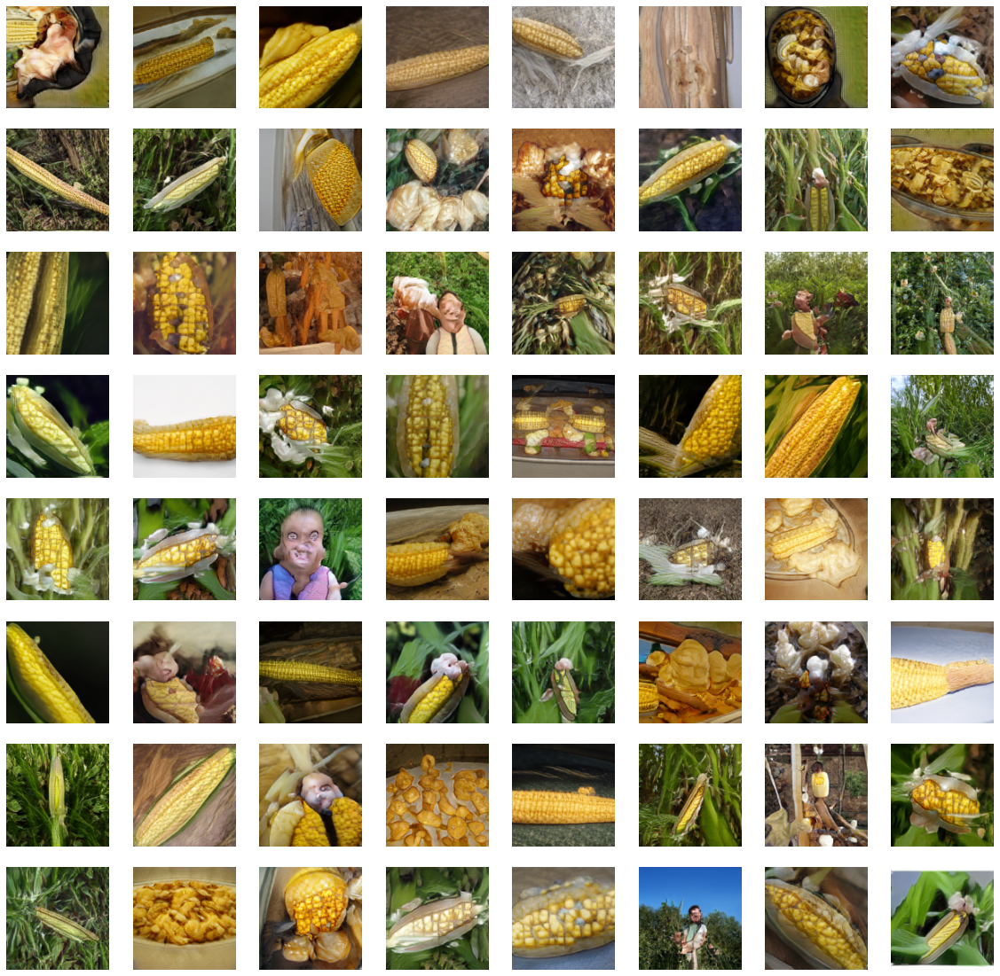

In [73]:
numpy_images = start_image.detach().cpu().numpy().transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_sample**0.5)
fig = plt.figure(figsize=(20, 20))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_sample):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

In [69]:
score_gen = D(start_image, label)
score_langevin = D(image, label)
num_impoves = (score_gen < score_langevin).sum()

In [70]:
num_impoves.item()/batch_size_sample

0.828125

In [76]:
score_gen.view(-1)

tensor([-5.7256e+00, -2.5098e-01,  1.5027e+00, -4.7434e+00, -2.7541e+00,
        -2.1324e+00, -1.9390e+00, -2.8144e+00, -3.9973e+00, -7.1750e+00,
        -2.5616e+00, -1.2174e+00, -2.4798e+00, -4.0011e+00, -5.0864e+00,
        -3.6266e+00, -1.9186e+00, -5.7480e+00, -5.5829e+00, -2.3253e+00,
        -3.6888e+00, -4.3224e+00, -3.0391e+00, -5.4264e+00, -4.1644e+00,
        -2.4120e+00, -4.6401e+00,  6.8863e-01, -3.9725e+00,  3.7559e-01,
         1.0895e+00, -6.9779e+00, -6.0145e+00, -5.7725e+00,  6.1638e-01,
         1.3610e+00, -1.6871e+00, -7.2189e+00, -4.1887e+00, -2.3884e+00,
         1.3360e-02, -2.6602e+00, -4.4404e+00, -1.8560e+00, -4.2024e+00,
        -4.6179e+00, -5.8683e+00, -2.3918e-01, -8.2292e+00, -3.9971e+00,
        -1.1839e+00, -1.6918e+00, -2.9378e+00, -4.7522e+00, -4.8463e+00,
        -3.5456e+00, -5.3229e+00,  2.7760e-01, -6.5533e+00, -4.1445e+00,
        -2.0652e+00, -6.0002e+00, -2.6548e-03, -4.0540e+00],
       grad_fn=<ViewBackward>)

In [77]:
score_langevin.view(-1)

tensor([-1.0039, -3.5232,  0.8848, -0.6696,  0.3196,  0.2597, -0.1920, -1.9392,
        -2.0100, -1.7924, -2.0000, -0.1031, -0.6569, -0.1410, -1.8202, -0.3464,
         7.4026, -1.5008, -0.8092,  0.1568, -0.1470,  1.3891, -1.7412,  0.7696,
        -4.3704, -1.3745, -0.2606,  3.9041, -1.7931, -0.4992,  4.4005, -4.7423,
         1.6799,  1.3911,  0.8943,  1.2509, -2.2914, -2.8499, -2.6167, -1.5774,
         0.6811,  4.0451, -4.5284, -3.4988,  5.6830,  0.2607, -1.9143, -2.7308,
        -3.5193, -3.1775, -1.3376, -1.2477, -1.5523, -0.6680,  0.5443, -0.7924,
        -0.0272,  1.2786, -2.4568, -1.2410, -0.8239,  2.5632, -2.1197,  1.5322])

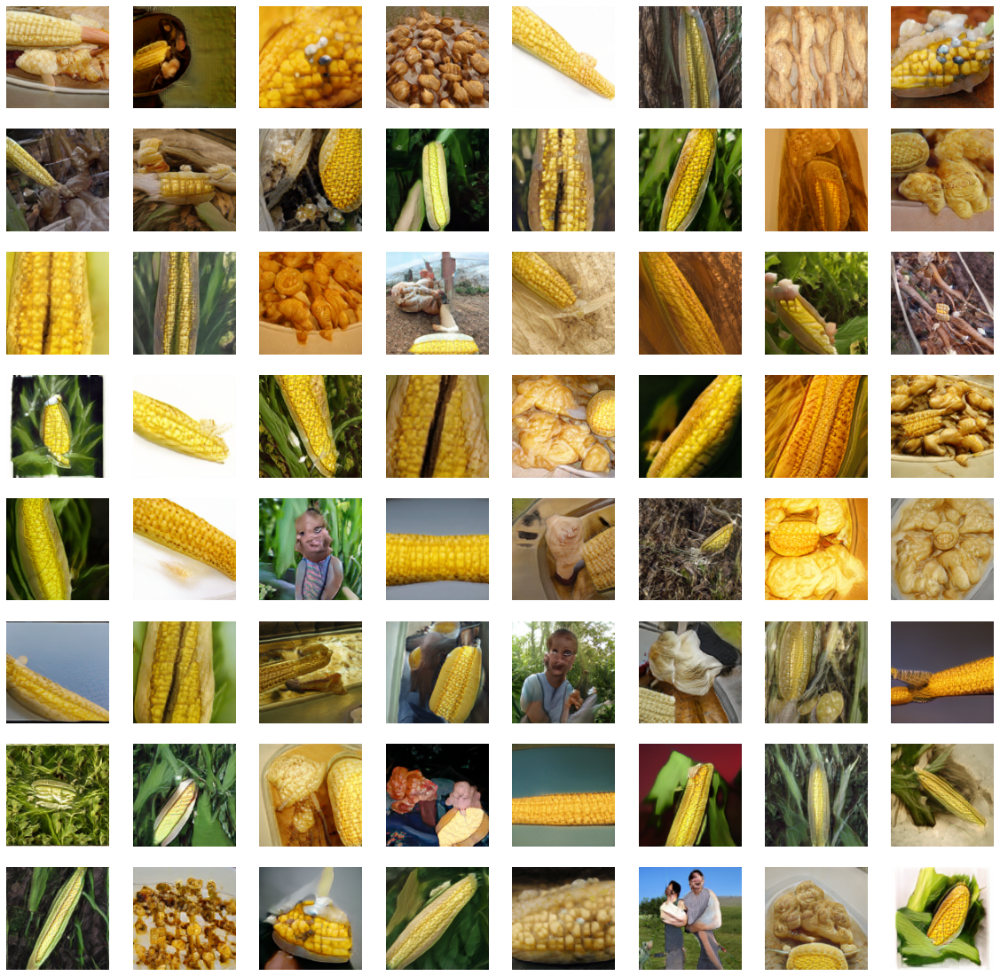

In [74]:
numpy_images = image.detach().cpu().numpy().transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_sample**0.5)
fig = plt.figure(figsize=(20, 20))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_sample):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

In [17]:
batch_size_sample = 64
n_steps = 50
grad_step = 1e-2
eps_scale = (2*grad_step)**0.5
random_seed = 42

torch.manual_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)

z = proposal.sample([batch_size_sample])
z.requires_grad_(True)
z_sp_mala, accp = mala_dynamics(z, target_gan, proposal, n_steps, grad_step, eps_scale)

  2%|▏         | 1/50 [00:40<32:44, 40.09s/it]


KeyboardInterrupt: 

In [90]:
num_class = 850
target_gan_teddy = partial(gan_energy_biggan,
                     num_class = num_class,
                     generator = G, 
                     discriminator = D, 
                     proposal = normal,
                     normalize_to_0_1 = normalize_to_0_1,
                     log_prob = log_prob)

In [91]:
batch_size_sample = 64
n_steps = 50
grad_step = 1e-2
eps_scale = (2*grad_step)**0.5
random_seed = 42

torch.manual_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)

z = proposal.sample([batch_size_sample])
z.requires_grad_(True)
z_sp = langevin_dynamics(z, target_gan_teddy, proposal, n_steps, grad_step, eps_scale)

  0%|          | 0/50 [00:04<?, ?it/s]


KeyboardInterrupt: 

In [80]:
last = z_sp[-1].data

In [81]:
label = num_class*torch.ones(last.shape[0], dtype=torch.long).to(last.device)
image = G(last, G.shared(label))

In [82]:
label = num_class*torch.ones(z.shape[0], dtype=torch.long).to(z.device)
start_image = G(z, G.shared(label))

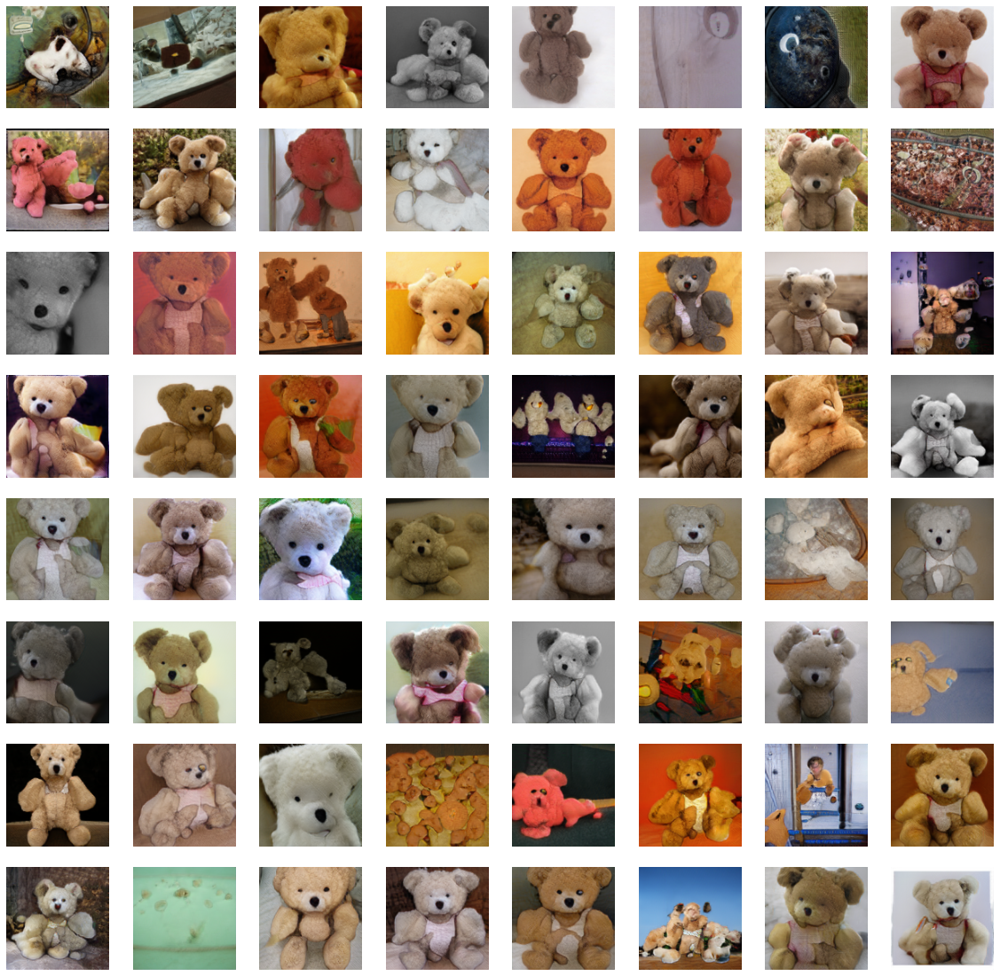

In [83]:
numpy_images = start_image.detach().cpu().numpy().transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_sample**0.5)
fig = plt.figure(figsize=(20, 20))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_sample):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

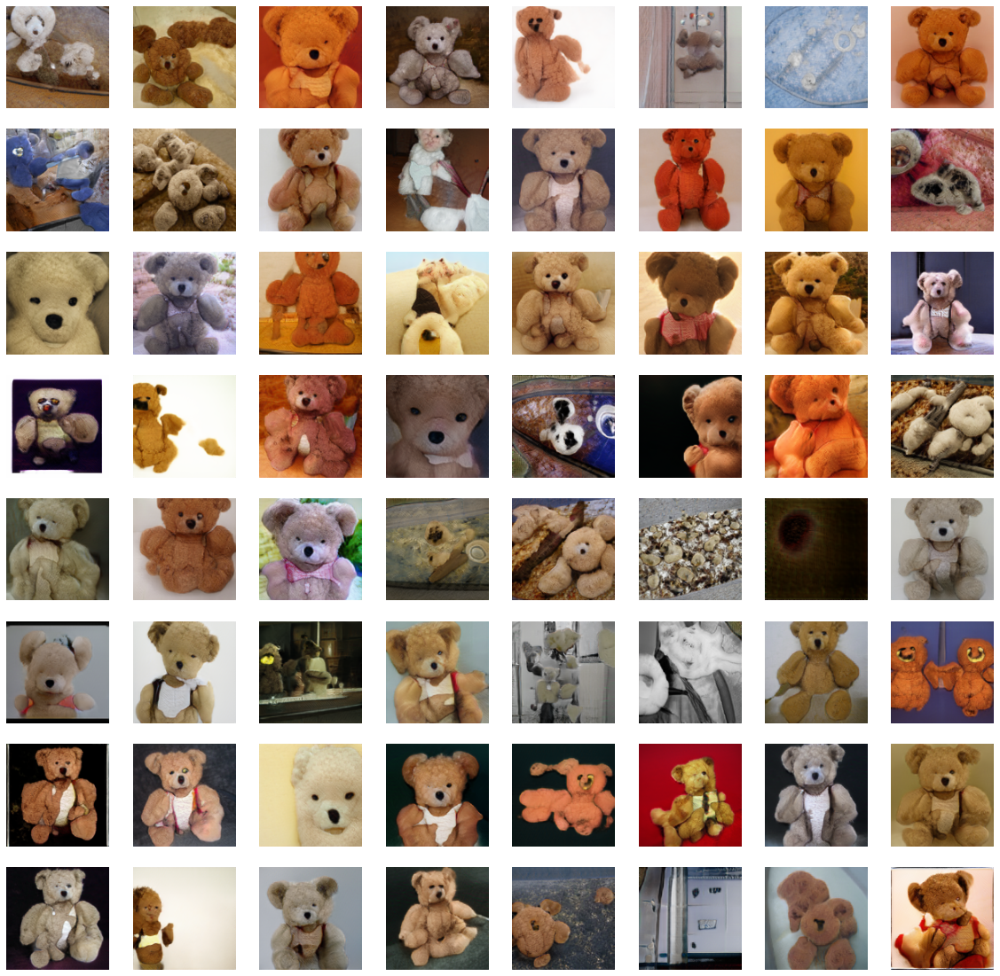

In [84]:
numpy_images = image.detach().cpu().numpy().transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_sample**0.5)
fig = plt.figure(figsize=(20, 20))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_sample):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

In [85]:
score_gen = D(start_image, label)
score_langevin = D(image, label)
num_impoves = (score_gen < score_langevin).sum()

In [86]:
num_impoves.item()/batch_size_sample

0.890625

In [87]:
num_impoves.item()

57

In [ ]:
batch_size_sample = 64
n_steps = 50
grad_step = 1e-2
eps_scale = (2*grad_step)**0.5
random_seed = 42

torch.manual_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)

z = proposal.sample([batch_size_sample])
z.requires_grad_(True)
z_sp_mala, accp = mala_dynamics(z, target_gan_teddy, proposal, n_steps, grad_step, eps_scale)

  0%|          | 0/50 [00:00<?, ?it/s]

# Dataloader and plotting

In [10]:
batch_size_fixed = 16
device = torch.device('cuda:0')
nz = G.dim_z
BASE_D = 'base'
num_class = 998


def gen_f(batch_size_fixed_=batch_size_fixed, num_class=num_class):
        noise = torch.randn(batch_size_fixed_, nz, device=device)
        y_ = num_class*torch.ones((batch_size_fixed_, ), dtype=torch.long).to(device)
        x = G(noise, G.shared(y_)).detach()
        #x = x.cpu().numpy()
        x = x.cpu()
        return x

def gen_disc_f(batch_size_fixed_=batch_size_fixed, num_class=num_class):
    noise = torch.randn(batch_size_fixed_, nz, device=device)
    y_ = num_class*torch.ones((batch_size_fixed_, ), dtype=torch.long).to(device)
    x = G(noise, G.shared(y_)).detach()
    scores = {BASE_D: D(x, y_).detach().cpu().numpy()}
    #x = x.cpu().numpy()
    x = x.cpu()
    return x, scores

In [12]:
wnid_teddy_bears = 'n04399382'
wnid_corn = 'n12144580'

In [87]:
batch_size_fixed = 64
images = gen_f(batch_size_fixed_ = batch_size_fixed, num_class=998)

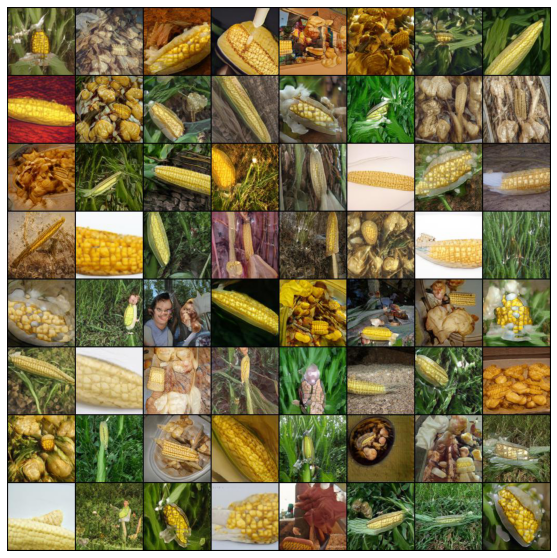

In [88]:
save_images = '%s/%s/corn_samples.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(images,
                             save_images,
                             nrow=int(batch_size_fixed**0.5),
                             normalize=True)

fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread(save_images)
ax.imshow(img)
ax.axis('off')
plt.show()

In [22]:
images, scores = gen_disc_f()

In [24]:
scores

{'base': array([[-3.055484  ],
        [-1.6296477 ],
        [-0.2693944 ],
        [-0.03041041],
        [-6.7312455 ],
        [-2.7220712 ],
        [ 0.9744473 ],
        [-3.1632185 ],
        [-3.5325863 ],
        [-5.470829  ],
        [-4.027464  ],
        [-3.779909  ],
        [-4.3181047 ],
        [-4.967715  ],
        [-3.2656403 ],
        [-3.735251  ]], dtype=float32)}

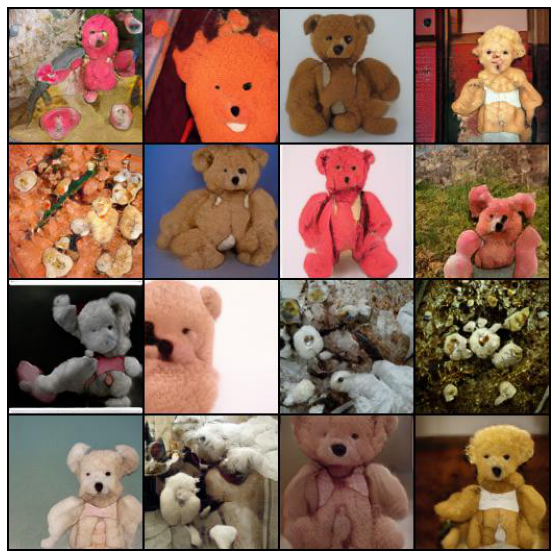

In [25]:
save_images = '%s/%s/mhgan.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(images,
                             save_images,
                             nrow=int(batch_size_fixed**0.5),
                             normalize=True)

fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread(save_images)
ax.imshow(img)
ax.axis('off')
plt.show()

In [10]:
workers = 4
dataroot = 'imagenet_corn'
image_size = 128
batch_size = 16
corn_dataset = get_data_loader(dataroot, workers, image_size, batch_size)

In [42]:
len(corn_dataset)

7

In [11]:
for i, data in enumerate(corn_dataset, 0):
    break

In [12]:
data[0].shape

torch.Size([16, 3, 128, 128])

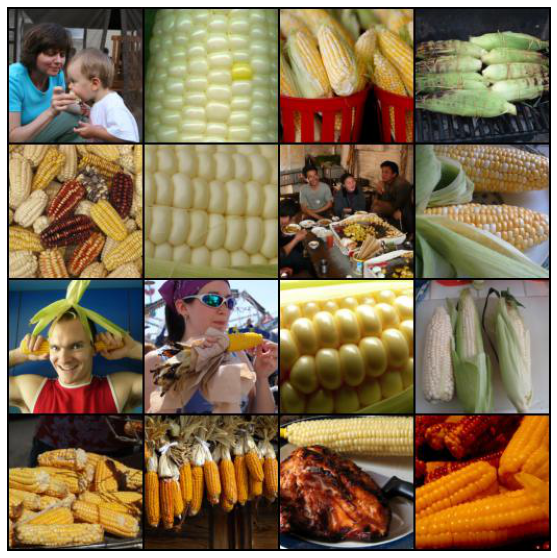

In [16]:
save_images = '%s/%s/сorn_imagenet.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(data[0],
                             save_images,
                             nrow=int(batch_size_fixed**0.5),
                             normalize=True)

fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread(save_images)
ax.imshow(img)
ax.axis('off')
plt.show()

In [18]:
y_ = num_class*torch.ones((batch_size_fixed, ), dtype=torch.long).to(device)

In [21]:
real_score = D(data[0].to(device), y_)

In [22]:
real_score

tensor([[ 5.4946],
        [ 9.9061],
        [ 4.7991],
        [-0.2569],
        [-1.4619],
        [13.4506],
        [-0.9865],
        [ 4.3815],
        [ 4.4488],
        [-2.2522],
        [12.5546],
        [ 0.4458],
        [-0.9452],
        [ 2.4833],
        [ 1.9081],
        [ 1.0685]], device='cuda:0')

In [24]:
images, fake_scores = gen_disc_f()

In [25]:
fake_scores

{'base': array([[-5.727922  ],
        [-2.047769  ],
        [-4.000046  ],
        [-3.2247353 ],
        [-0.20495296],
        [-5.00583   ],
        [-2.050461  ],
        [-1.1979814 ],
        [-3.6445239 ],
        [-3.6722    ],
        [-4.8677473 ],
        [-2.308618  ],
        [-3.580715  ],
        [-3.18426   ],
        [-1.3037294 ],
        [-5.2996664 ]], dtype=float32)}

In [37]:
numpy_images[0]

array([[[-0.52156866, -0.5294118 , -0.5686275 ],
        [-0.5058824 , -0.5058824 , -0.56078434],
        [-0.47450978, -0.47450978, -0.5372549 ],
        ...,
        [-0.7647059 , -0.77254903, -0.8039216 ],
        [-0.75686276, -0.7647059 , -0.8039216 ],
        [-0.73333335, -0.7254902 , -0.7647059 ]],

       [[-0.47450978, -0.4823529 , -0.52156866],
        [-0.45098037, -0.4588235 , -0.5058824 ],
        [-0.4352941 , -0.4352941 , -0.4980392 ],
        ...,
        [-0.77254903, -0.78039217, -0.8117647 ],
        [-0.77254903, -0.78039217, -0.8117647 ],
        [-0.75686276, -0.7490196 , -0.7882353 ]],

       [[-0.38823527, -0.3960784 , -0.4352941 ],
        [-0.38823527, -0.3960784 , -0.4352941 ],
        [-0.40392154, -0.40392154, -0.4588235 ],
        ...,
        [-0.7647059 , -0.77254903, -0.8039216 ],
        [-0.7882353 , -0.79607844, -0.827451  ],
        [-0.78039217, -0.77254903, -0.8117647 ]],

       ...,

       [[-0.09019607, -0.34117645, -0.49019605],
        [-0

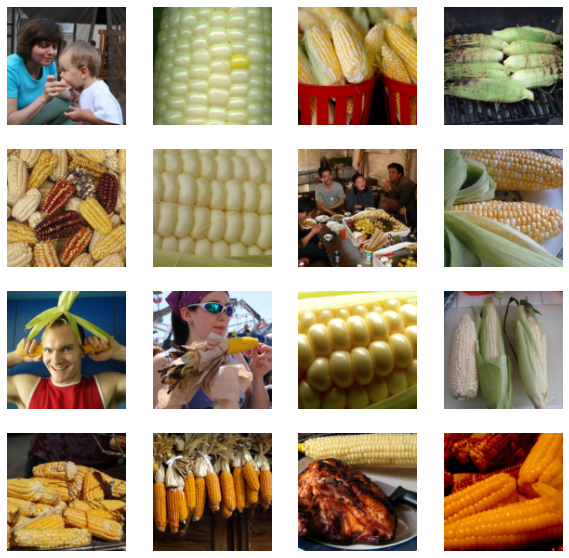

In [41]:
numpy_images = data[0].detach().cpu().numpy().transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_fixed**0.5)
fig = plt.figure(figsize=(10, 10))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_fixed):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

In [ ]:
images, fake_scores = gen_disc_f()

# MHGAN

Based on https://github.com/uber-research/metropolis-hastings-gans/blob/master/mhgan/demo_mhgan.py

In [11]:
from mhgan_utils import (validate_scores, validate_X,
                         validate, batched_gen_and_disc,
                         discriminator_analysis, base,
                         enhance_samples, enhance_samples_series)

In [12]:
workers = 4
dataroot = 'imagenet_corn'
image_size = 128
batch_size = 16
num_class = 998
device = torch.device('cuda:0')
nz = G.dim_z
LABEL = 'label'
corn_dataloader = get_data_loader(dataroot, workers, image_size, batch_size)

In [13]:
real_calib_data = []
for i, data in enumerate(corn_dataloader, 0):
    real_calib_data.append(data[0])

In [14]:
len(real_calib_data)

48

In [15]:
48*16

768

In [16]:
from numpy import concatenate as concat
import pandas as pd

In [17]:
num_class

998

In [18]:
BASE_D = 'base'
scores_real = {}
scores_real[BASE_D] = concat([D(data.to(device), 
                                num_class*torch.ones((data.shape[0], ), 
                                                     dtype=torch.long).to(device)).sigmoid().detach().cpu().numpy()
                                for data in real_calib_data])
scores_real[BASE_D] = scores_real[BASE_D][:, 0]

In [19]:
scores_real[BASE_D].shape

(768,)

In [20]:
(scores_real[BASE_D] > 0.7).sum()

450

In [21]:
scores_real_df = validate_scores(scores_real)

In [22]:
scores_real_df

,base
0,0.510246
1,0.996584
2,0.964788
3,0.476399
4,0.869511
...,...
763,0.998422
764,0.049650
765,0.261513
766,0.061339


In [27]:
(scores_real_df[BASE_D] > 0.7).sum()

450

In [28]:
n_real_batches, rem = divmod(len(scores_real[BASE_D]), batch_size)

In [29]:
n_real_batches

48

In [26]:
def gen_disc_f(batch_size_fixed_):
    noise = torch.randn(batch_size_fixed_, nz, device=device)
    y_ = num_class*torch.ones((batch_size_fixed_, ), dtype=torch.long).to(device)
    x = G(noise, G.shared(y_)).detach()
    scores = {BASE_D: D(x, y_).sigmoid().detach().cpu().numpy()[:, 0]}
    x = x.cpu().numpy()
    return x, scores

In [30]:
_, scores_fake_df = batched_gen_and_disc(gen_disc_f, n_real_batches, batch_size)

In [31]:
(scores_fake_df[BASE_D] > 0.7).sum()

10

In [32]:
outf = 'temp'
outf = os.path.abspath(os.path.expanduser(outf))

print('using dump folder:')
print(outf)

using dump folder:
/home/daniil/gans-mcmc/temp


In [33]:
outf

'/home/daniil/gans-mcmc/temp'

In [34]:
epoch = 0
ref_method = (BASE_D, 'raw')
incep_ref = BASE_D + '_iso_base'
score_fname = os.path.join(outf, '%d_scores.csv' % epoch)
calib_dict = {'iso': cl.Isotonic}
#perf_report, calib_report, clf_df = \
#    discriminator_analysis(scores_fake_df, scores_real_df, ref_method,
#                           dump_fname=score_fname)
pred_df_dump, clf_df = \
     discriminator_analysis(scores_fake_df, scores_real_df, ref_method,
                            calib_dict=calib_dict,
                            dump_fname=score_fname)

In [35]:
pred_df_dump

,base_iso,label
0,0.338462,False
1,0.000000,False
2,0.338462,False
3,0.052632,False
4,0.233333,False
...,...,...
763,1.000000,True
764,1.000000,True
765,1.000000,True
766,0.083333,True


In [45]:
#PICK_DICT = {'MH': mh.mh_sample, 'base': base, 'reject': mh.rejection_sample}
#PICK_DICT = {'MH': mh.mh_sample}
PICK_DICT = {'MH': mh.mh_sample}

In [37]:
print('image dumps...')
# Some image dumps in case we want to actually look at generated images
pickers = {'MH': mh.mh_sample}
X, picked, cap_out, alpha = enhance_samples_series(gen_disc_f, scores_real_df, 
                                                   clf_df, pickers)

image dumps...
max scores
base    0.969907


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160
number of selected images = 1 out of 160
acceptance rate = 0.00625


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


In [134]:
X.shape

(16, 3, 128, 128)

In [125]:
23/(16*10*16)

0.008984375

In [116]:
alpha

base                                        
         raw                      iso               
          MH base    reject        MH base    reject
0   0.225881  1.0  0.188385  1.000000  1.0  0.172414
1   1.000000  1.0  0.540781  1.000000  1.0  0.583909
2   1.000000  1.0  0.118356  1.000000  1.0  0.500000
3   1.000000  1.0  0.219967  0.445129  1.0  0.500000
4   0.673114  1.0  0.023458  1.000000  1.0  0.032710
5   0.849744  1.0  0.637088  1.000000  1.0  0.095324
6   1.000000  1.0  0.571469  0.737968  1.0  0.583909
7   1.000000  1.0  0.357550  0.247848  1.0  0.301696
8   1.000000  1.0  0.647669  1.000000  1.0  0.014273
9   1.000000  1.0  0.251292  1.000000  1.0  0.497680
10  0.814598  1.0  0.499600  1.000000  1.0  0.500000
11  1.000000  1.0  0.616498  1.000000  1.0  0.588235
12  0.092876  1.0  0.511905  0.669565  1.0  0.097561
13  0.295397  1.0  0.085919  1.000000  1.0  0.317972
14  1.000000  1.0  0.274464  1.000000  1.0  0.235398
15  1.000000  1.0  0.869413  1.000000  1.0  0.928051

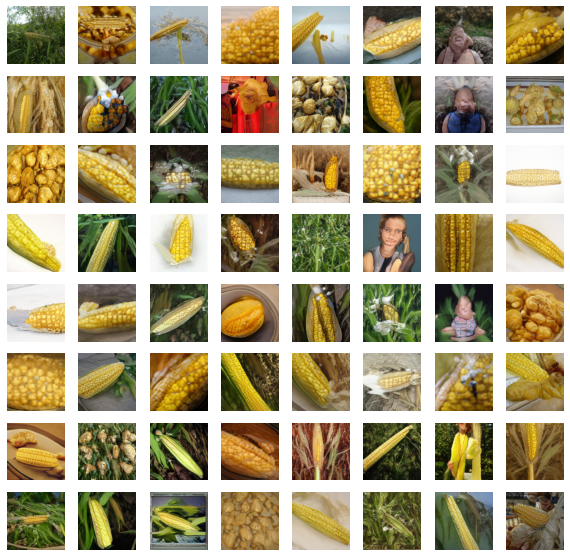

In [82]:
batch_size_fixed = 64
numpy_images = X[:batch_size_fixed].transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_fixed**0.5)
fig = plt.figure(figsize=(10, 10))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_fixed):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

In [38]:
def mh_sample_acceptence(d_score, score_max=None, random=np.random):
    assert(np.ndim(d_score) == 1 and len(d_score) > 0)
    assert(0 <= np.min(d_score) and np.max(d_score) <= 1)

    OR = mh.disc_2_odds_ratio(d_score)
    OR_U = OR / random.rand(len(d_score))

    picked_round = 0
    alpha = 1.0
    number_of_acceptence = 1
    for ii in range(1, len(d_score)):
        if OR[picked_round] <= OR_U[ii]:
            alpha = mh.accept_prob_MH_disc(d_score[picked_round], d_score[ii])
            picked_round = ii
            number_of_acceptence += 1
    
    acceptence_rate = number_of_acceptence/len(d_score)
    return picked_round, alpha, acceptence_rate

In [50]:
batch_size = 16   # Batch size to use when calling the pytorch generator G
chain_batches = 10  # Number of batches to use total for the pickers
max_est_batches = 156  # Num batches for estimating M in DRS pilot samples

In [51]:
X_, scores_fake_df = batched_gen_and_disc(gen_disc_f, chain_batches, batch_size)

In [52]:
scores_fake_df

,base
0,0.004174
1,0.099056
2,0.214770
3,0.058220
4,0.050313
...,...
155,0.029010
156,0.000722
157,0.107761
158,0.074842


In [53]:
init_idx = np.random.choice(len(scores_real_df))

In [54]:
init_idx

126

In [59]:
init_idx = np.random.choice(len(scores_real_df))
disc_name =  'base'
calib_name = 'iso'
calibrator = clf_df[(disc_name, calib_name)]
s0 = scores_real_df[disc_name].values[init_idx]
s_ = np.concatenate(([s0], scores_fake_df[disc_name].values))

In [60]:
s0

0.99351245

In [179]:
s_.shape

(161,)

In [177]:
s_

array([9.71036971e-01, 7.96081591e-03, 1.65624395e-02, 2.24267063e-03,
       7.93240033e-03, 1.86883993e-02, 1.02762375e-02, 4.81153280e-03,
       2.73915287e-03, 1.60079196e-01, 9.29010138e-02, 9.80783440e-03,
       3.00527904e-02, 2.68949773e-02, 8.92626122e-02, 4.52749897e-03,
       1.24909356e-03, 6.59223199e-02, 5.16943112e-02, 6.17240489e-01,
       6.34490792e-03, 1.48757294e-01, 3.70951854e-02, 1.41264617e-01,
       4.78345063e-03, 3.81384906e-03, 4.97139879e-02, 2.24125921e-03,
       1.36919379e-01, 2.50844993e-02, 6.77640317e-04, 1.83012001e-02,
       5.99597931e-01, 2.33179443e-02, 1.48736024e-02, 5.64291105e-02,
       1.02393972e-02, 1.74924303e-02, 5.50522134e-02, 1.78549215e-01,
       6.68349629e-03, 3.48340422e-01, 1.49845947e-02, 2.48078793e-01,
       1.26242954e-02, 8.42004549e-03, 3.88370156e-02, 3.00320494e-03,
       4.05907370e-02, 3.44009954e-03, 2.03238726e-02, 6.79104496e-03,
       8.26547816e-02, 1.90328285e-01, 1.71021034e-03, 1.32094398e-02,
      

In [180]:
s_ = calibrator.predict(s_)

In [181]:
s_

array([0.9736842 , 0.05263158, 0.08163265, 0.        , 0.05263158,
       0.10204082, 0.08163265, 0.03225806, 0.        , 0.45454547,
       0.31914893, 0.08163265, 0.10204082, 0.10204082, 0.31914893,
       0.        , 0.        , 0.18421052, 0.18421052, 0.90909094,
       0.03225806, 0.4       , 0.12820514, 0.4       , 0.03225806,
       0.        , 0.18421052, 0.        , 0.4       , 0.10204082,
       0.        , 0.08163265, 0.90909094, 0.10204082, 0.08163265,
       0.18421052, 0.08163265, 0.08163265, 0.18421052, 0.45454547,
       0.03225806, 0.627907  , 0.08163265, 0.5625    , 0.08163265,
       0.05263158, 0.12820514, 0.        , 0.12820514, 0.        ,
       0.10204082, 0.03225806, 0.31914893, 0.45454547, 0.        ,
       0.08163265, 0.45454547, 0.7924528 , 0.        , 0.10204082,
       0.08163265, 0.19406673, 0.        , 0.        , 0.18421052,
       0.10204082, 0.03225806, 0.10204082, 0.        , 0.7924528 ,
       0.15353106, 0.12820514, 0.45454547, 0.08163265, 0.18421

In [182]:
picked_round, alpha, acceptence_score = mh_sample_acceptence(s_)

/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


In [183]:
acceptence_score

0.11180124223602485

In [39]:
batch_size = 16   # Batch size to use when calling the pytorch generator G
chain_batches = 30
acceptence_scores_arr = []
num_averages = 1
for nn in range(num_averages):
    X_, scores_fake_df = \
        batched_gen_and_disc(gen_disc_f, chain_batches, batch_size)
    init_idx = np.random.choice(len(scores_real_df))
    disc_name =  'base'
    calib_name = 'iso'
    calibrator = clf_df[(disc_name, calib_name)]
    s0 = scores_real_df[disc_name].values[init_idx]
    s_ = np.concatenate(([s0], scores_fake_df[disc_name].values))
    s_ = calibrator.predict(s_)
    picked_round, alpha, acceptence_score = mh_sample_acceptence(s_)
    acceptence_scores_arr.append(acceptence_score)
acceptence_scores_arr = np.array(acceptence_scores_arr)
print(acceptence_scores_arr.mean())

0.09355509355509356


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


In [62]:
acceptence_scores_arr

array([0.09355509])